In [2]:
%%bash
!(stat -t /usr/local/lib/*/dist-packages/google/colab > /dev/null 2>&1) && exit 
pip install ninja 2>> install.log
git clone https://github.com/SIDN-IAP/global-model-repr.git tutorial_code 2>> install.log

In [3]:
try: # set up path
    import google.colab, sys, torch
    sys.path.append('/content/tutorial_code')
    if not torch.cuda.is_available():
        print("Change runtime type to include a GPU.")  
except:
    pass

# Import packages

Import torch, netdissect, matplotlib, and set up some things.

In [4]:
import torch, os, matplotlib.pyplot as plt
from netdissect import nethook, imgviz, show, segmenter, renormalize, upsample, tally, pbar
from netdissect import setting

torch.backends.cudnn.benchmark = True
torch.set_grad_enabled(False) # not training anything!

# Load some data

**ds** is a dataset of pictures of imagenet images.

It is the validation set from the ImageNet dataset.

In [5]:
dataset = "imagenet"

In [6]:
from quickdataset import QuickImageFolder
from models.resnet import InsResNet50
from torchvision import transforms
from helper import *

epoch = 240
image_size = 224
crop = 0.2
crop_padding = 32
batch_size = 12
num_workers = 24
train_sampler = None
moco = True

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
normalize = transforms.Normalize(mean=mean, std=std)

folder_path = "/data/vision/torralba/ganprojects/yyou/CMC/{}_models".format(dataset)
model_name = "/{}_MoCo0.999_softmax_16384_resnet50_lr_0.03_decay_0.0001_bsz_128_crop_0.2_aug_CJ".format(dataset)
epoch_name = "/ckpt_epoch_{}.pth".format(epoch)
my_path = folder_path + model_name + epoch_name
if dataset == "imagenet":
    data_path =  "/data/vision/torralba/datasets/imagenet_pytorch/imagenet_pytorch"
elif dataset == "places365":
    data_path = "/data/vision/torralba/datasets/places/places365_standard/places365standard_easyformat"
train_folder = data_path + "/train"
val_folder = data_path + "/val"

In [7]:
val_transform = transforms.Compose([
                    transforms.Resize(image_size + crop_padding),
                    transforms.CenterCrop(image_size),
                    transforms.ToTensor(),
                    normalize,
                ])

ds = QuickImageFolder(val_folder, transform=val_transform, two_crop=False)
ds_loader = torch.utils.data.DataLoader(
        ds, batch_size=batch_size, shuffle=(train_sampler is None),
        num_workers=num_workers, pin_memory=True, sampler=train_sampler)

Making fast dataset ...  /data/vision/torralba/datasets/imagenet_pytorch/imagenet_pytorch/val
Walking image files ... 



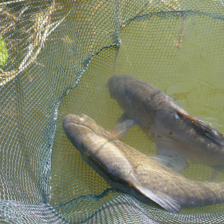

In [8]:
iv = imgviz.ImageVisualizer(224, source=ds, percent_level=0.99)
show(iv.image(ds[0][0]))

# Load Pre-trained MoCo Imagenet Model

**model** is a pretrained MoCo Unsupervised Resnet50
For this model, disable DataParallel for compatibility reasons.

In [9]:
checkpoint = torch.load(my_path)
model_checkpoint = {key.replace(".module",""):val for key, val in checkpoint['model'].items()}

In [10]:
model = InsResNet50(parallel=False)
model.load_state_dict(model_checkpoint)
model = nethook.InstrumentedModel(model)
model.cuda()

InstrumentedModel(
  (model): InsResNet50(
    (encoder): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): R

In [11]:
renorm = renormalize.renormalizer(source=ds, target='zc')
ivsmall = imgviz.ImageVisualizer((56, 56), source=ds, percent_level=0.99)

## Warmup: look at the model

### Choose a layer

- What is the fully qualified name of the last convolutional layer? 
- Usually the most interesting layer to probe is the last convolutional layer right before the final pooling.
- If it's a resnet, then good layers to probe will be the activations right before each pooling or downsampling step (especially the last).

In [12]:
print(model)

InstrumentedModel(
  (model): InsResNet50(
    (encoder): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): R

In [13]:
layername = "encoder.layer4.2.conv3"
# layername2 = "encoder.layer4.2.bn3"
# layername3 = "encoder.layer4.2.relu"

In [14]:
batch = next(iter(ds_loader))[0]

## Examine raw unit activations.

This bit of code shows the output of individual filters in a layer directly.

It shows each filter in two ways.  First, it overlays a region of high activation on the image; and on the right, it shows a heatmap of filter activations.


In [15]:
model.retain_layer(layername)
model(batch.cuda())
acts = model.retained_layer(layername).cpu()

In [16]:
upfn = upsample.upsampler(
    target_shape=(56, 56),
    data_shape=(7, 7),
)

def flatten_activations(batch, *args):
    image_batch = batch
    _ = model(image_batch.cuda())
    acts = model.retained_layer(layername).cpu()
    hacts = upfn(acts)
    return hacts.permute(0, 2, 3, 1).contiguous().view(-1, acts.shape[1])

def tally_quantile_for_layer(layername):
    rq = tally.tally_quantile(
        flatten_activations,
        dataset=ds,
        sample_size=1000,
        batch_size=100,
        cachefile='results/{}_{}_rq_cache.npz'.format(dataset, layername))
    return rq

rq = tally_quantile_for_layer(layername)

Loading cached results/imagenet_encoder.layer4.2.conv3_rq_cache.npz


### Exercise 4: look at the ranges of activations

The loop above collects statistics of each filter over a sample of 1000 images.
What are typical values of the filters?  How often do they fire?

* Plot median (0.5 quantile) values of each filter in conv5_3.
* Compare the 0.5, 0.8, 0.9, and 0.99 quantiles for each filter.
* Do different units activate in different ranges from one another?


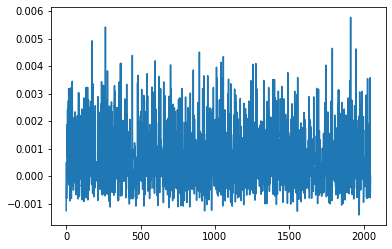

In [17]:
plt.plot(rq.quantiles(0.9))

In [21]:
iv = imgviz.ImageVisualizer(224, source=ds, percent_level=0.95, quantiles=rq)

### Exercise 5: examine images that maximize each unit

The loop below identifies the images, out of a sample of 1000, that cause each filter to activate strongest.  The current code tallies up images that maximize the mean activation of the filter over the image.
* (Optional) Change the code to find images that maximize the maximum acvitation across the image instead.

In [22]:
sample_size = 1000

def max_activations(batch, *args):
    image_batch = batch.cuda()
    _ = model(image_batch)
    acts = model.retained_layer(layername)
    return acts.view(acts.shape[:2] + (-1,)).max(2)[0]

def mean_activations(batch, *args):
    image_batch = batch.cuda()
    _ = model(image_batch)
    acts = model.retained_layer(layername)
    return acts.view(acts.shape[:2] + (-1,)).mean(2)

topk = tally.tally_topk(
    mean_activations,
    dataset=ds,
    sample_size=sample_size,
    batch_size=100,
    cachefile='results/{}_cache_mean_topk.npz'.format(layername)
)

top_indexes = topk.result()[1]

Loading cached results/encoder.layer4.2.conv3_cache_mean_topk.npz


Below is a loop that runs the model for each of the top-activating images for a particular unit (12), and then shows where that unit activates within the images.

* Change the unit number to examine the behavior of different units.


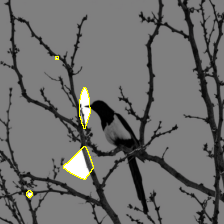
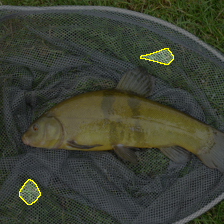
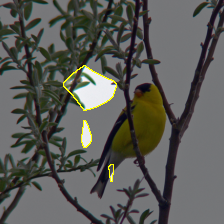
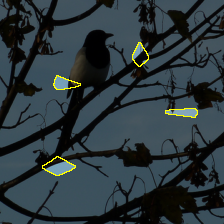
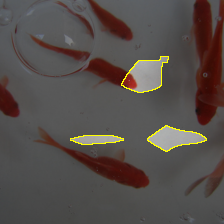
...
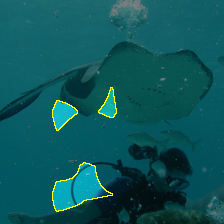
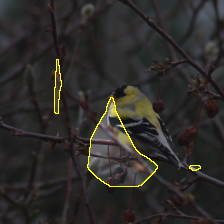
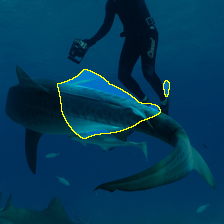
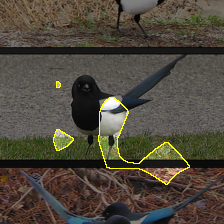
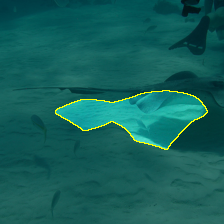

In [24]:
show.blocks([
    ['unit %d' % u,
     'img %d' % i,
     'pred: %s' % ds.classes[model(ds[i][0][None].cuda()).max(1)[1].item()],
     [iv.masked_image(
        ds[i][0],
        model.retained_layer(layername)[0],
        u)]
    ]
    for u in [i for i in range(10,20)]
    for i in top_indexes[u, :12]
])

The following code automates the above process for all the units, collecting a visualization of top images for each unit in the network.

* Examine `unit_images[u]` for various units `u`.

In [ ]:
def compute_activations(image_batch):
    image_batch = image_batch.cuda()
    _ = model(image_batch)
    acts_batch = model.retained_layer(layername)
    return acts_batch

unit_images = iv.masked_images_for_topk(
    compute_activations,
    ds,
    topk,
    k=5,
    num_workers=10,
    pin_memory=True,
    cachefile='results/cache_top10images.npz')

## Loading a segmentation model.

To systematically identify units that match semantic concepts better or worse, we can find units that align well with the predictions of a semantic segmentation network.

The code below runs and displays segmentations on a batch of images.

**seg** is a tensor that assigns a set of semantic segmentation labels to every pixel of an image.  `seg[i, 0]` shows the 0th label for each pixel of the `i`th image.

In [20]:
segmodel, seglabels, segcatlabels = setting.load_segmenter('netpqc')

RuntimeError: unexpected EOF, expected 37396423 more bytes. The file might be corrupted.

In [ ]:
seg = segmodel.segment_batch(renorm(batch).cuda(), downsample=4)
show([(iv.image(batch[i]), iv.segmentation(seg[i, 0]),
            iv.segment_key(seg[i,0], segmodel))
            for i in range(len(seg))])

The code below finds the intersections between every unit's 99th percentile activation, and every segmentation class identified by the semgenter.  It can take a few minutes to run, so you can reduce the sample size if you do not want to wait.

In [ ]:
level_at_99 = rq.quantiles(0.99).cuda()[None,:,None,None]

def compute_selected_segments(batch, *args):
    image_batch = batch.cuda()
    seg = segmodel.segment_batch(renorm(image_batch), downsample=4)
    _ = model(image_batch)
    acts = model.retained_layer(layername)
    hacts = upfn(acts)
    iacts = (hacts > level_at_99).float() # indicator where > 0.99 percentile.
    return tally.conditional_samples(iacts, seg)

condi99 = tally.tally_conditional_mean(
    compute_selected_segments,
    dataset=ds,
    sample_size=sample_size,
    cachefile='results/cache_condi99.npz')

iou99 = tally.iou_from_conditional_indicator_mean(condi99)
iou99.shape

The code below sorts the units, showing the units with the best match to a segmentation class first.

In [ ]:
iou_unit_label_99 = sorted([(
    unit, concept.item(), seglabels[concept], bestiou.item())
    for unit, (bestiou, concept) in enumerate(zip(*iou99.max(0)))],
    key=lambda x: -x[-1])
for unit, concept, label, score in iou_unit_label_99[:20]:
    show(['unit %d; iou %g; label "%s"' % (unit, score, label),
          [unit_images[unit]]])


Which types of patterns are detected across the whole representation?

The following code counts up segmentation classes that are matched by units, and plots the histograms.

In [ ]:
iou_threshold = 0.04
unit_label_99 = [
        (concept.item(), seglabels[concept],
            segcatlabels[concept], bestiou.item())
        for (bestiou, concept) in zip(*iou99.max(0))]
labelcat_list = [labelcat
        for concept, label, labelcat, iou in unit_label_99
        if iou > iou_threshold]
import IPython
IPython.display.SVG(setting.graph_conceptcatlist(labelcat_list))

To delete cached results and run things again, you can remove and recreate results directory.

In [ ]:
# rm -rv '../results'

In [ ]:
# mkdir '../results'

# Network Dissection

Network dissection is a systematic method for finding and measuring single units (convolutional filters) that match meaningful semantic concepts in a vision network.

Our fundamental question is this: how does the network decompose the task of understanding what an image is?  Does it identify any features that are understandable to a human?

Simply running this notebook will provide a simple dissection, but at each step, there are exercises for modifying the notebook to find more interesting results.

## About the netdissect library

The netdissect library contains several useful packages for inspecting internals of a vision network.
Here are packages that we use in this notebook:

 * **nethook** wraps any pytorch model, adding the ability to record or modify any internal computation.
 * **imgviz** provides ImageVisualizer, that collects together several useful image visualization functions.
 * **show** arranges nested arrays of PIL images and strings as nicely formatted HTML for display in a notebook.
 * **segmenter** provides an interface and a pretrained implementation for a semantic segmentation network.
 * **tally** gathers statistics over a dataset, based on your function to compute features for each datum.
 * **renormalize** deals with conversions between the zoo of RGB encoding scales typically seen in vision data.
 * **upsample** provids simple functions for resampling grid data at higher or lower resolutions.
 * **pbar** is a progress bar.

These will be explained a bit more in the exercises below.  Of course you can always run `help(object)` for a bit more information on most things in the library.  For this tutorial we also have a package **settting**, which automatically downloads and creates datasets and pretrained models that we will be looking at.

## About pretrained models and data

Here are some fixed variables that we define up-front for all the objects that we will be inspecting in this tutorial.

* **model** is the network we will look at.  It is a VGG convolutional network, trained to classify images of scenes into one of 365 place categories.  We wrap `model` as a `nethook.InstrumenteModel` so that we can easily retrieve and modiry its internal activations.
* **ds** is a small held-out sample from the Places dataset that was used to train the model; each entry is a pytorch tensor representing an image, and an integer representing the class.  A pytorch dataset can be derefernces like an array, so `ds[35]` is a pair `(x, y)` where `x` is a tensor containing RGB image data for a scene and `y` is an integer for the human-given class label.  Classnames are available as `ds.class[y]`.
* **renorm** is a function that renormalizes RGB data from the staistically-based scaling used in `ds` to a simple `[-1...1]` range scale.
* **segmodel** is a semantic segmentation network trained to recognize a large vocabulary of objects and parts of objects within scenes.  We will use it as a reference, to see if there are any internal filters that approximately match the same concepts.
* **seglabels** are human-readable names for the numerical segmentation classes.
* **iv** is an image visualization object that visualizes 2d data such as images and heatmaps as 224x224 images.
* **ivsmall** is another visualization object, but outputs smaller 56x56 images.
* **resfile** is a function that generates filenames in a results subdirectory that we will use for caching data.